<a href="https://colab.research.google.com/github/Pavel184/Machine_vision/blob/Homework_lesson_8/Homework_lesson_8_rev_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework_lesson_8

## Переключение версии TensorFlow

In [9]:
%tensorflow_version 2.x

In [10]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

## Загрузка и подготовка датасета LFW

In [11]:
tfds.disable_progress_bar()
(train_ds), ds_info = tfds.load(
    'LFW', 
    as_supervised=True,
    with_info=True
)

In [12]:
train_ds = train_ds.get('train')

## Визуализация датасета LFW

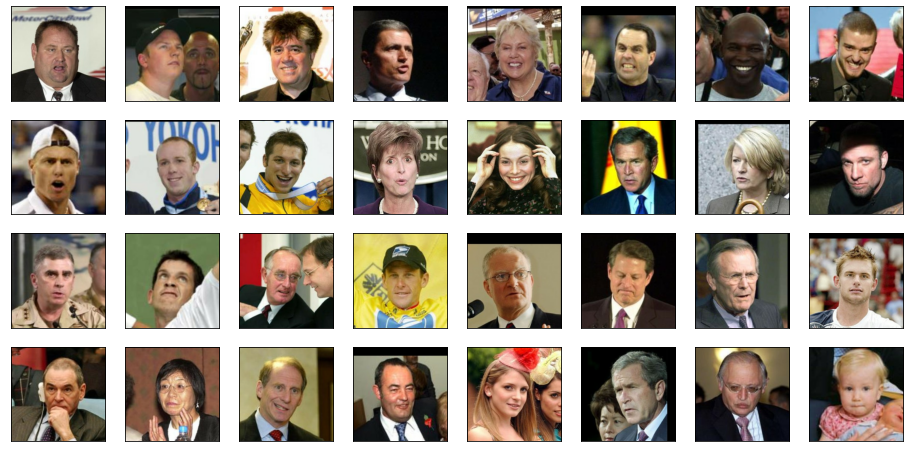

In [13]:
some_samples = [x[1] for x in iter(train_ds.take(32))]

fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j])
    plt.xticks([]), plt.yticks([])
plt.show()

## Deep Convolutional GAN (DCGAN)

## Создание Генератора и Дискриминатора

In [14]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(128*16*16, activation='relu'),
    tf.keras.layers.Reshape((16, 16, 128)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(512, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='valid'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='valid'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),            
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dense(256),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dense(1),
])

## Подготовка пайплайна данных и оптимизатора

In [15]:
INPUT_DIM = 256
NUM_EPOCHS = 110
BATCH_SIZE = 32
HALF_BATCH_SIZE = int(BATCH_SIZE / 2)
LEARNING_RATE = 0.0002

def prepare(label, img):
    img = (tf.cast(img, tf.float32) - 127.5) / 127.5 
    return img


train_ds = train_ds.shuffle(buffer_size=1000)
train_ds = train_ds.map(prepare)
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## Обучение GAN

[Step  0] D Loss: 0.6939; G Loss: 0.0007


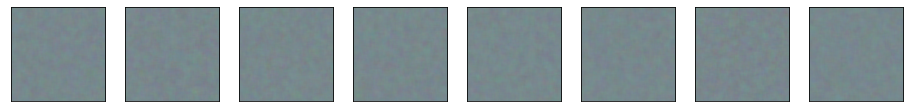

[Step 1000] D Loss: 0.1419; G Loss: 6.1345


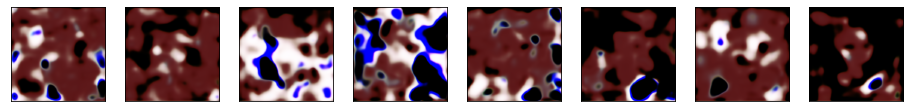

[Step 2000] D Loss: 0.1626; G Loss: 3.1393


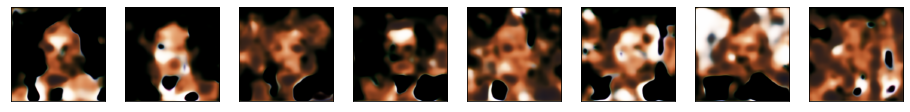

[Step 3000] D Loss: 0.4652; G Loss: 4.0646


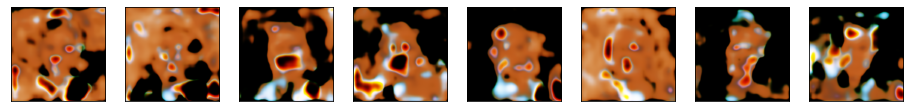

[Step 4000] D Loss: 0.0288; G Loss: 4.0373


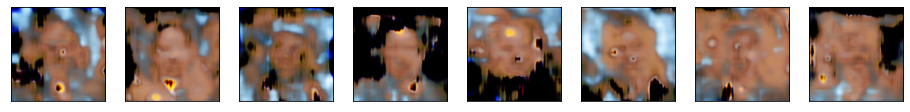

[Step 5000] D Loss: 0.0940; G Loss: 4.1600


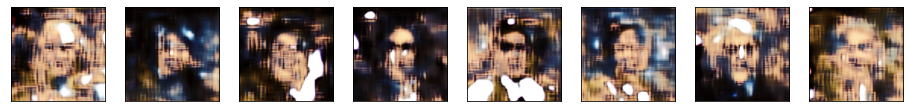

[Step 6000] D Loss: 0.2699; G Loss: 1.2380


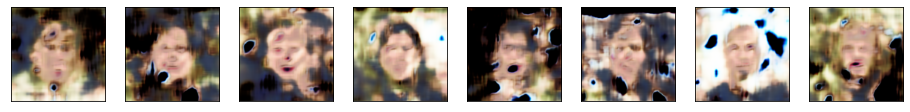

[Step 7000] D Loss: 0.0671; G Loss: 3.3890


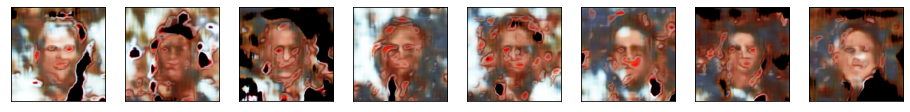

[Step 8000] D Loss: 0.2635; G Loss: 3.7857


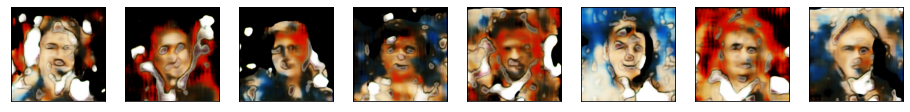

[Step 9000] D Loss: 0.1021; G Loss: 5.1091


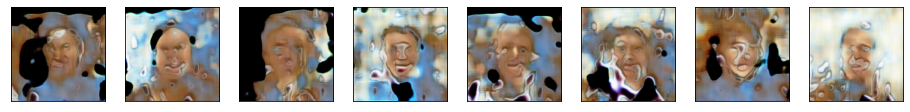

[Step 10000] D Loss: 0.1768; G Loss: 4.7065


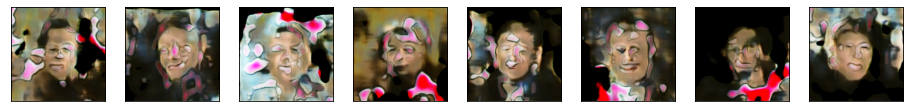

[Step 11000] D Loss: 0.1250; G Loss: 3.9046


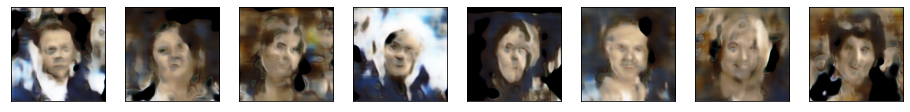

[Step 12000] D Loss: 0.2093; G Loss: 2.9846


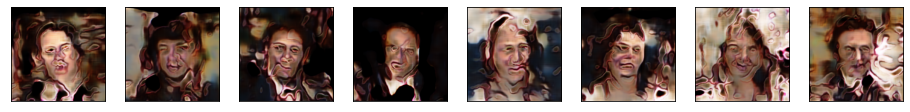

[Step 13000] D Loss: 0.2202; G Loss: 4.1798


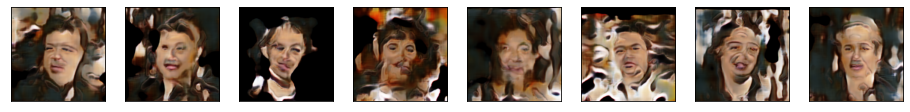

[Step 14000] D Loss: 0.2512; G Loss: 2.9745


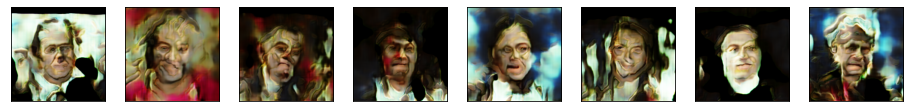

[Step 15000] D Loss: 0.0525; G Loss: 4.8592


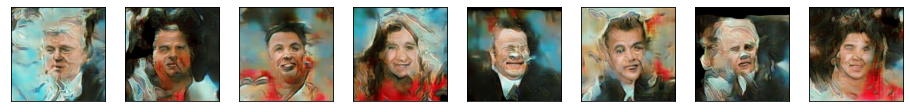

[Step 16000] D Loss: 0.1590; G Loss: 2.9299


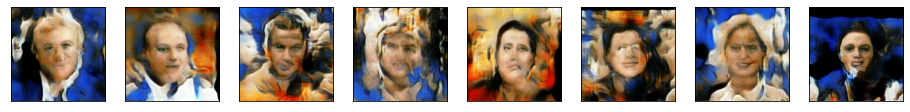

[Step 17000] D Loss: 0.0607; G Loss: 3.1294


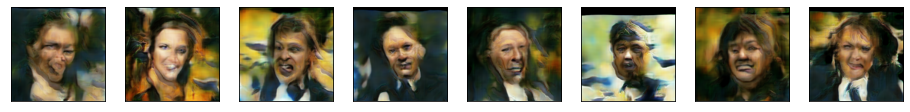

[Step 18000] D Loss: 0.1224; G Loss: 4.1819


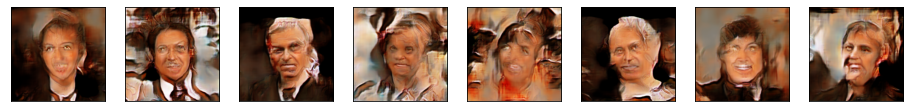

[Step 19000] D Loss: 0.1644; G Loss: 4.8147


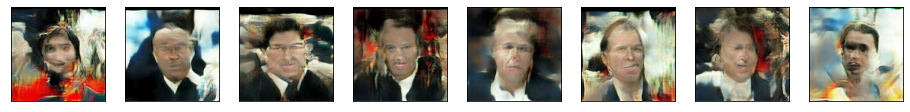

[Step 20000] D Loss: 0.0628; G Loss: 5.6243


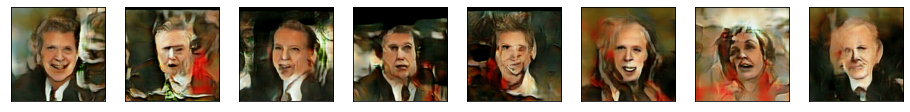

[Step 21000] D Loss: 0.1170; G Loss: 4.1983


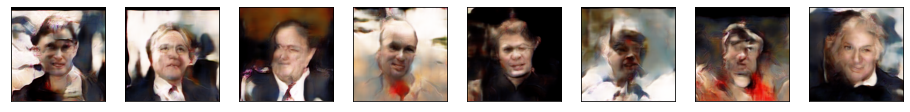

[Step 22000] D Loss: 0.1384; G Loss: 4.6293


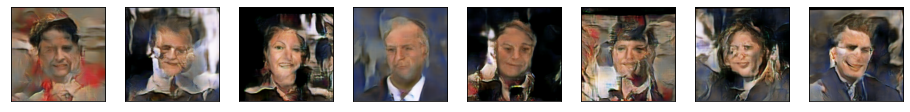

[Step 23000] D Loss: 0.0466; G Loss: 5.4953


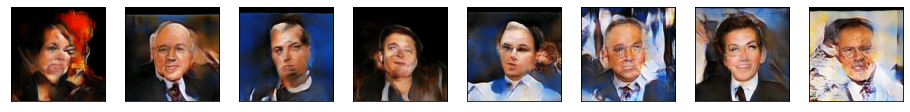

[Step 24000] D Loss: 0.2143; G Loss: 5.6353


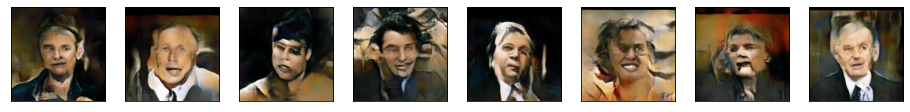

[Step 25000] D Loss: 0.0944; G Loss: 4.3359


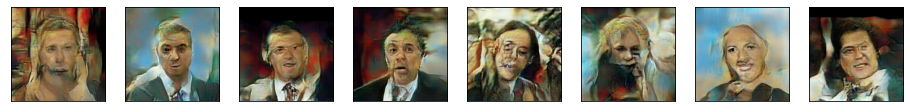

[Step 26000] D Loss: 0.1553; G Loss: 5.0707


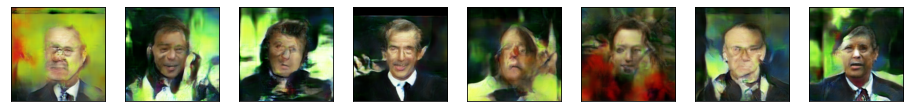

[Step 27000] D Loss: 0.1941; G Loss: 5.0028


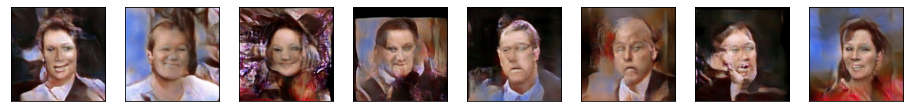

[Step 28000] D Loss: 0.0741; G Loss: 5.6374


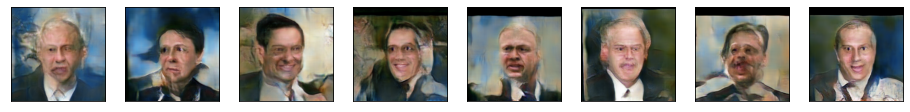

[Step 29000] D Loss: 0.1082; G Loss: 5.4185


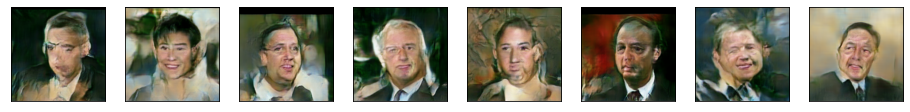

[Step 30000] D Loss: 0.2541; G Loss: 5.6503


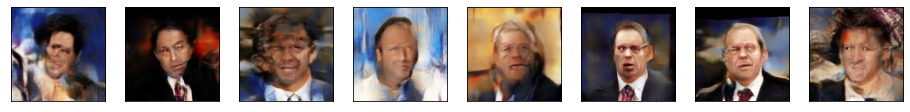

[Step 31000] D Loss: 0.0318; G Loss: 4.5650


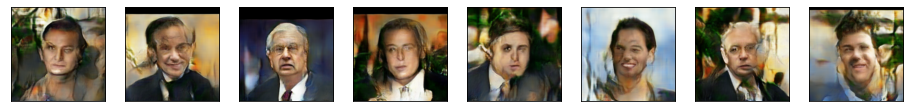

[Step 32000] D Loss: 0.0109; G Loss: 6.7824


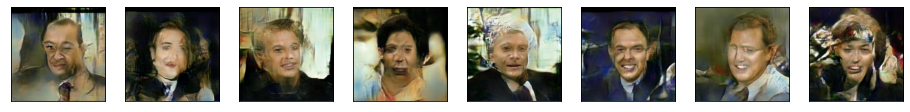

[Step 33000] D Loss: 0.0796; G Loss: 6.0964


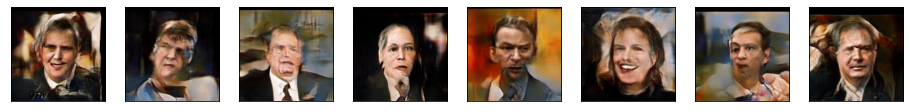

[Step 34000] D Loss: 0.1208; G Loss: 5.8134


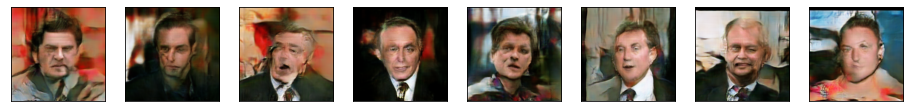

[Step 35000] D Loss: 0.0136; G Loss: 4.6844


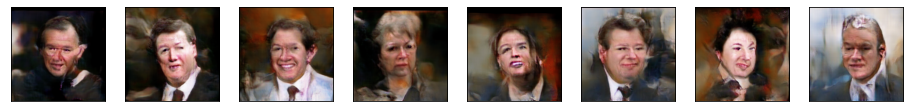

[Step 36000] D Loss: 0.0314; G Loss: 5.7568


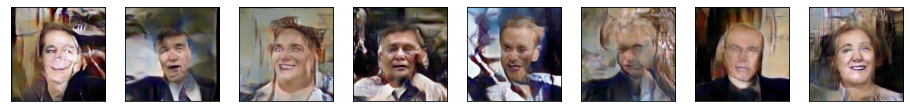

[Step 37000] D Loss: 0.0066; G Loss: 6.5954


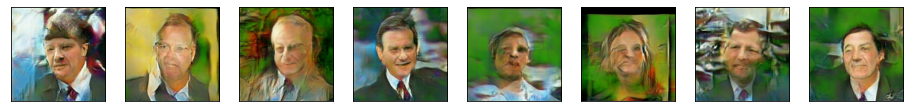

[Step 38000] D Loss: 0.0032; G Loss: 6.7756


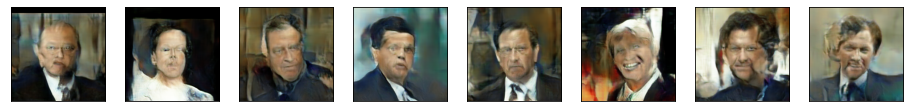

[Step 39000] D Loss: 0.0674; G Loss: 7.0887


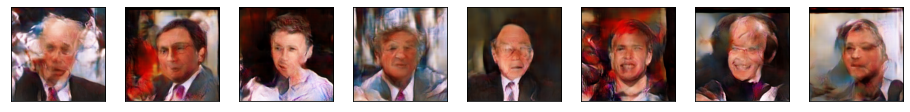

[Step 40000] D Loss: 0.0254; G Loss: 7.1122


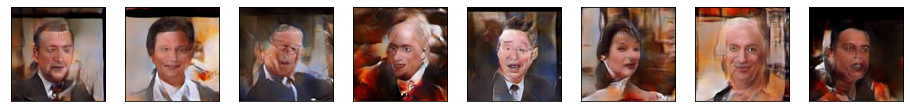

[Step 41000] D Loss: 0.0192; G Loss: 5.6754


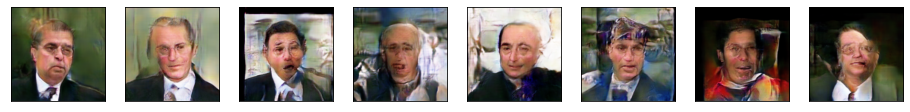

[Step 42000] D Loss: 0.0610; G Loss: 6.5338


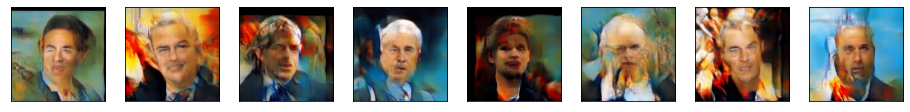

[Step 43000] D Loss: 0.1845; G Loss: 7.4615


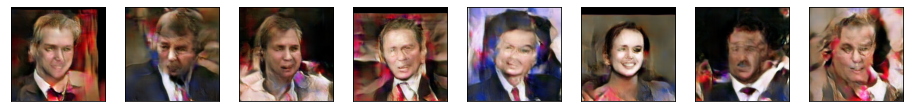

[Step 44000] D Loss: 0.0101; G Loss: 7.3759


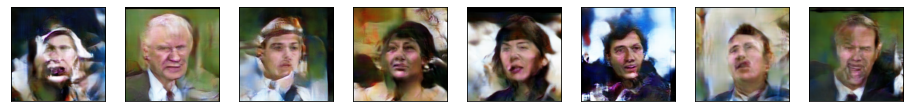

[Step 45000] D Loss: 0.0528; G Loss: 6.1517


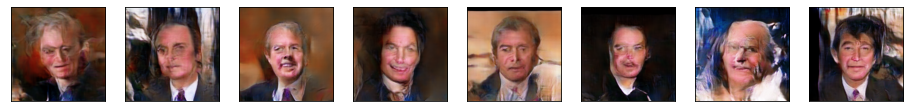

[Step 46000] D Loss: 0.0681; G Loss: 4.8304


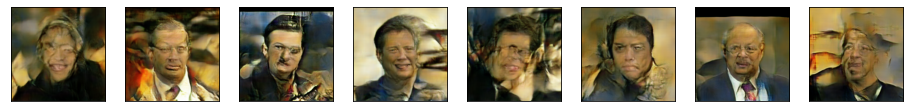

[Step 47000] D Loss: 0.0318; G Loss: 8.1817


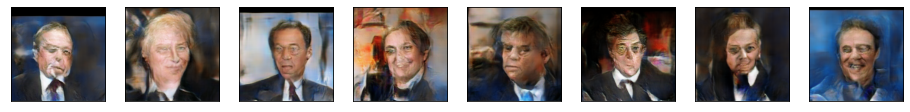

[Step 48000] D Loss: 0.0826; G Loss: 8.4922


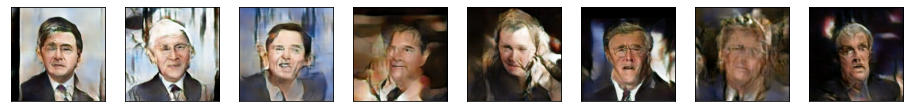

[Step 49000] D Loss: 0.0435; G Loss: 5.0371


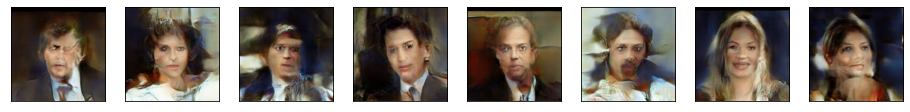

[Step 50000] D Loss: 0.0033; G Loss: 7.5557


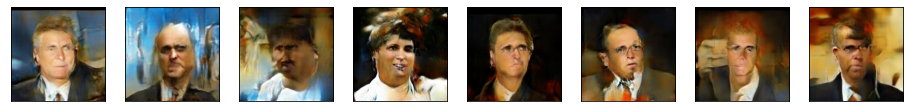

[Step 51000] D Loss: 0.0034; G Loss: 7.8575


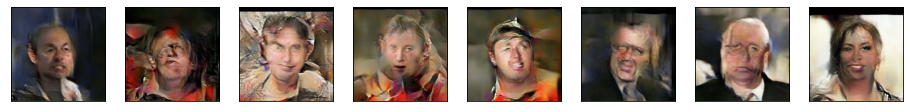

[Step 52000] D Loss: 0.0062; G Loss: 6.1409


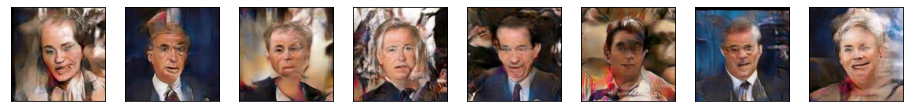

[Step 53000] D Loss: 0.0146; G Loss: 6.6819


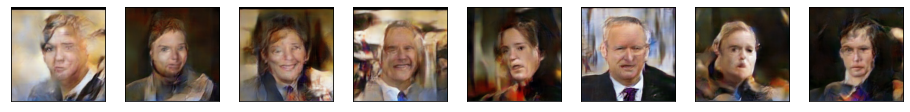

[Step 54000] D Loss: 0.0061; G Loss: 10.5882


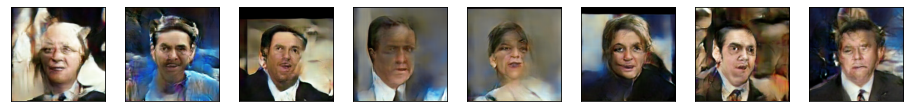

[Step 55000] D Loss: 0.1016; G Loss: 7.1463


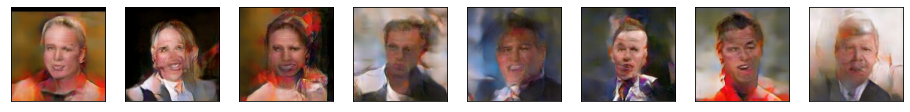

[Step 56000] D Loss: 0.0045; G Loss: 6.3962


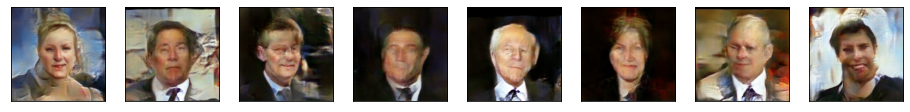

[Step 57000] D Loss: 0.0026; G Loss: 7.9463


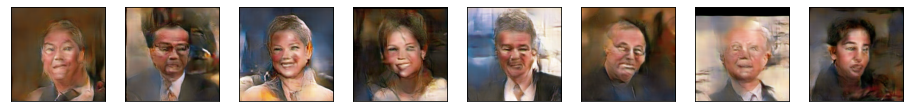

[Step 58000] D Loss: 0.0009; G Loss: 6.9207


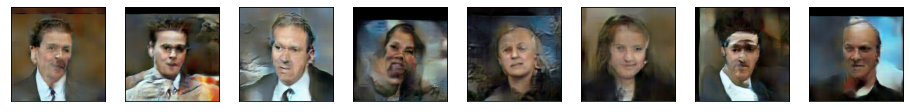

[Step 59000] D Loss: 0.0037; G Loss: 7.5833


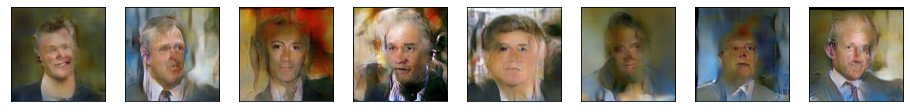

[Step 60000] D Loss: 0.0051; G Loss: 6.2291


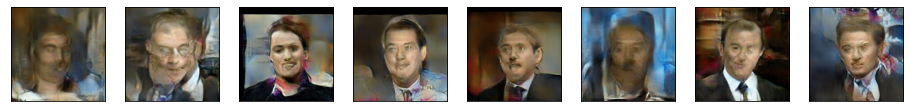

[Step 61000] D Loss: 0.0319; G Loss: 8.1640


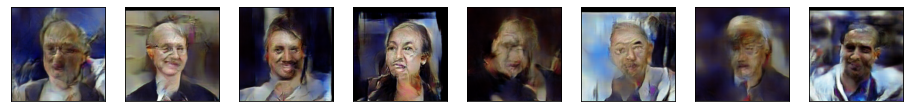

[Step 62000] D Loss: 0.0087; G Loss: 7.1493


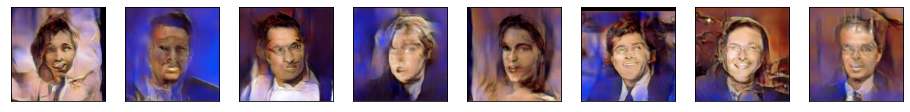

[Step 63000] D Loss: 0.0070; G Loss: 8.2199


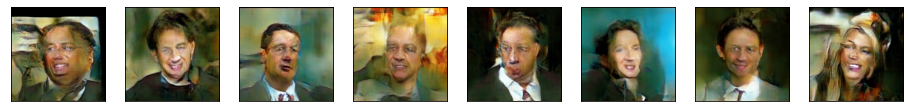

[Step 64000] D Loss: 0.2445; G Loss: 8.2871


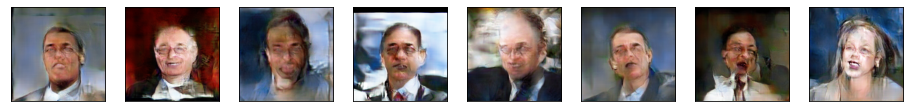

[Step 65000] D Loss: 0.0131; G Loss: 8.4086


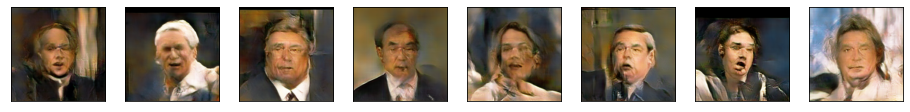

[Step 66000] D Loss: 0.0002; G Loss: 8.4898


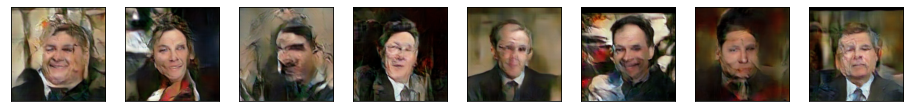

[Step 67000] D Loss: 0.0025; G Loss: 7.1709


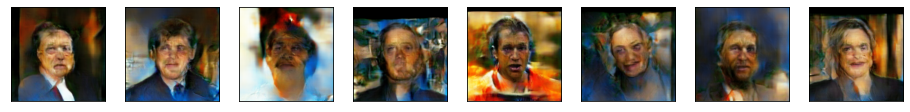

[Step 68000] D Loss: 0.0091; G Loss: 9.4249


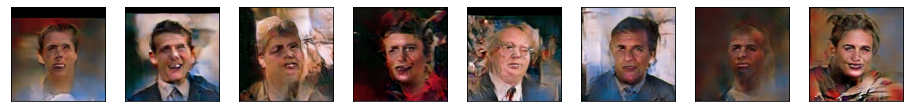

[Step 69000] D Loss: 0.0629; G Loss: 8.6904


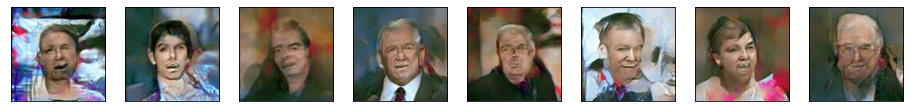

[Step 70000] D Loss: 0.0073; G Loss: 8.1170


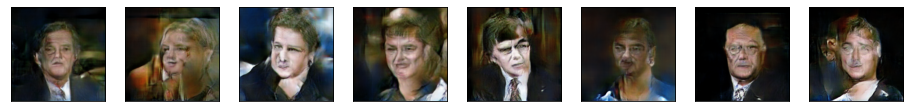

[Step 71000] D Loss: 0.0043; G Loss: 9.2972


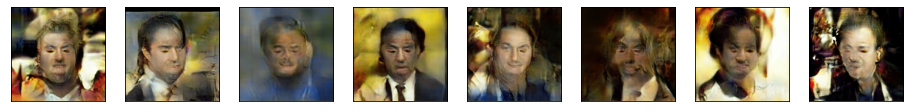

[Step 72000] D Loss: 0.0128; G Loss: 9.0912


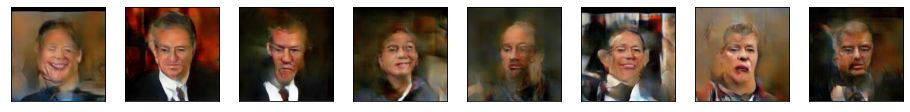

[Step 73000] D Loss: 0.0092; G Loss: 9.7857


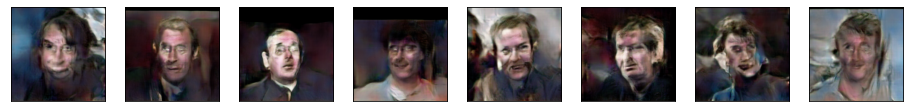

[Step 74000] D Loss: 0.0001; G Loss: 9.6936


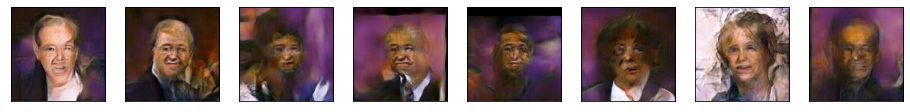

[Step 75000] D Loss: 0.0199; G Loss: 9.7769


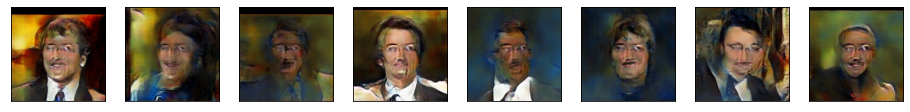

[Step 76000] D Loss: 0.1013; G Loss: 11.2473


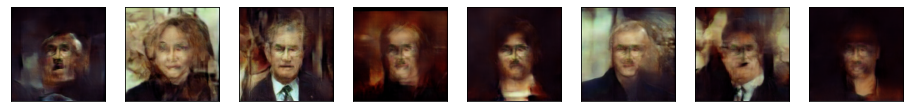

[Step 77000] D Loss: 0.0080; G Loss: 8.1287


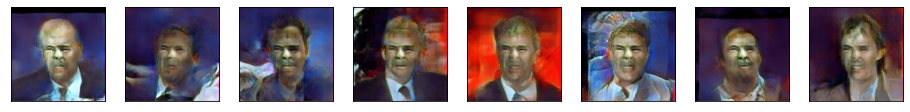

[Step 78000] D Loss: 0.0000; G Loss: 10.2408


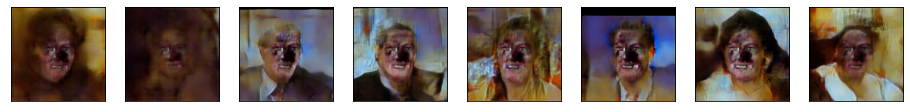

[Step 79000] D Loss: 0.0001; G Loss: 10.5424


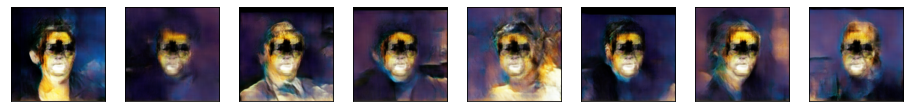

[Step 80000] D Loss: 0.0002; G Loss: 10.2186


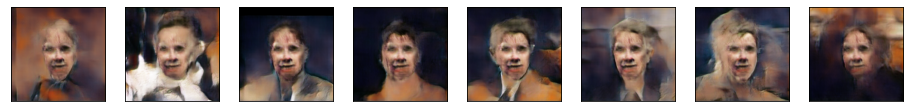

[Step 81000] D Loss: 0.0006; G Loss: 7.9006


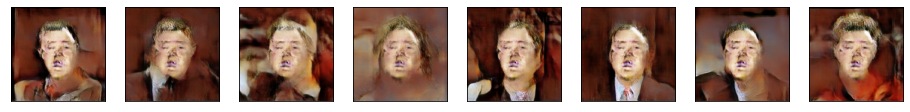

[Step 82000] D Loss: 0.0351; G Loss: 12.3051


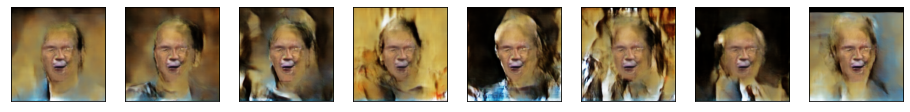

[Step 83000] D Loss: 0.0002; G Loss: 9.9071


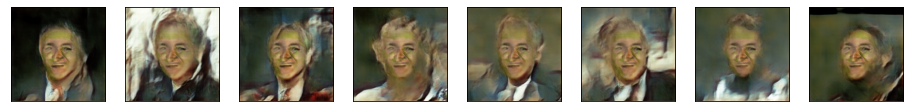

[Step 84000] D Loss: 0.0244; G Loss: 6.3937


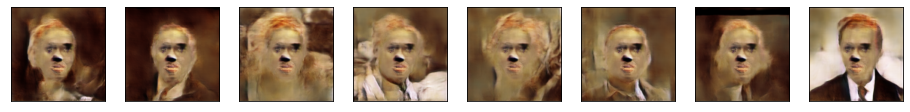

[Step 85000] D Loss: 0.0011; G Loss: 15.0271


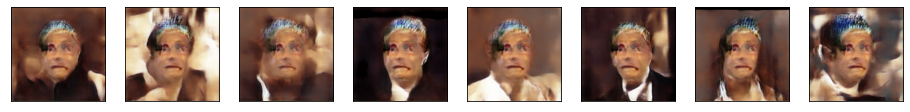

[Step 86000] D Loss: 0.0000; G Loss: 15.5177


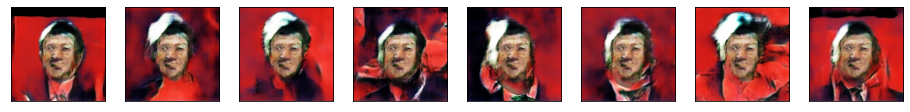

[Step 87000] D Loss: 0.0001; G Loss: 18.1069


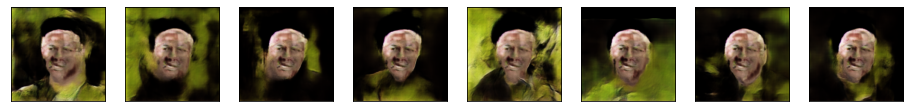

[Step 88000] D Loss: 0.2099; G Loss: 9.6852


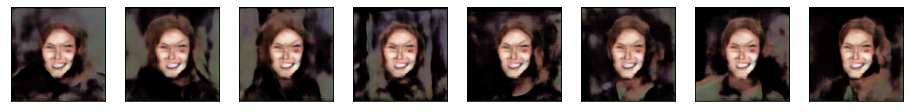

[Step 89000] D Loss: 0.0010; G Loss: 10.4314


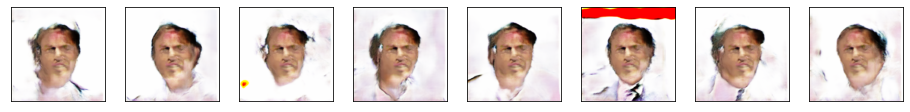

[Step 90000] D Loss: 0.0001; G Loss: 15.3442


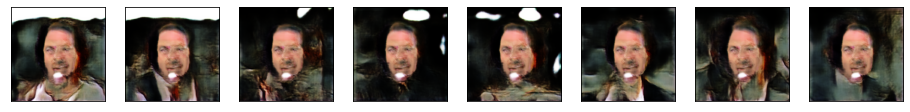

In [16]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        logits = discriminator(generator(noise, training=True))
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 1000 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        
        fig = plt.figure(figsize=(16, 8))
        for j in range(len(syntetic_images)):
            ax = fig.add_subplot(4, 8, j+1)
            ax.imshow((syntetic_images[j]+1)/2)
            plt.xticks([]), plt.yticks([])
        plt.show()


## Тестирование свёрточного генератора

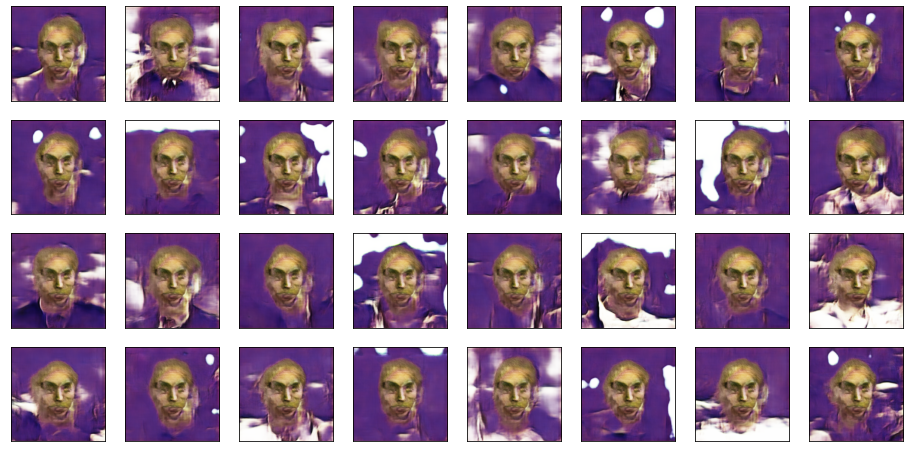

In [17]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)

fig = plt.figure(figsize=(16, 8))
for j in range(len(syntetic_images)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow((syntetic_images[j]+1)/2)
    plt.xticks([]), plt.yticks([])
plt.show()

## Интерполяция в латентном пространстве

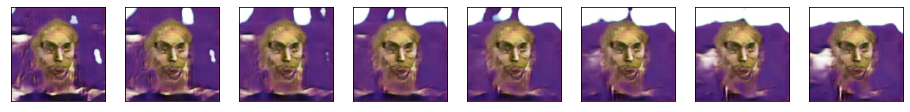

In [18]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
fig = plt.figure(figsize=(16, 8))
for j in range(len(syntetic_images)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow((syntetic_images[j]+1)/2)
    plt.xticks([]), plt.yticks([])
plt.show()

Можно заметить, что после 59000 шага качество генерации начало снижаться. Скорее всего из-за того, что дискриминатор обучившись "задавил" генератор.